In [189]:
# load libraries
import pandas as pd
from datetime import datetime, timedelta
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from __future__ import division
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as smf
from chart_studio import plotly as py
import plotly.offline as pyoff
import plotly.graph_objects as go
pyoff.init_notebook_mode()
from IPython import display 
from sklearn.metrics import mean_squared_error

In [190]:
#load in wrangled and cleaned dataframes

In [191]:
df_reg = pd.read_csv('registrations.csv.gz')
df_reg.head(10)

,Registration Valid Date,ZIP Code,VIN Prefix,DMV ID,DMV Snapshot,VIN Model Year,State,Vehicle Name,Technology,RegistrationYearMonth,Year
0,2011-01-01,12932,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
1,2011-01-01,11946,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
2,2011-01-01,11368,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
3,2011-01-01,11368,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
4,2011-01-01,11101,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
5,2011-01-01,10962,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
6,2011-01-01,10562,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
7,2011-01-01,10562,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
8,2011-01-01,10562,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011
9,2011-01-01,10031,5ASAG274,1,NY DMV Direct (2011),2,NY,GEM NEV,BEV,201101,2011


In [116]:
df_reg.info

<bound method DataFrame.info of         Registration Valid Date  ZIP Code VIN Prefix  DMV ID  \
0                    2011-01-01     12932   5ASAG274       1   
1                    2011-01-01     11946   5ASAG274       1   
2                    2011-01-01     11368   5ASAG274       1   
3                    2011-01-01     11368   5ASAG274       1   
4                    2011-01-01     11101   5ASAG274       1   
...                         ...       ...        ...     ...   
2371084              2021-10-01     11803   3MW5P9J0      57   
2371085              2021-10-01     10591   1C4JJXP6      57   
2371086              2021-10-01     11784   1G1RD6E4      57   
2371087              2021-10-01     11203   5YJYGDEE      57   
2371088              2021-10-01     11249   JTDKARFP      57   

                       DMV Snapshot VIN Model Year State  \
0              NY DMV Direct (2011)              2    NY   
1              NY DMV Direct (2011)              2    NY   
2              NY D

In [4]:
# load in Alternative Fuel Stations dataframe
df_alt_stations = pd.read_csv('alt_fuel.csv')
df_alt_stations.head(10)

,ZIP,State,City,Street Address,Station Name,Status Code,Georeference,Groups With Access Code,Geocode Status,Latitude,Longitude,ID,Updated At,Country,Access Code,Fuel Type Code
0,12953,NY,Malone,42 Finney Blvd,Red Roof Inn Malone - Tesla Destination,E,POINT (-74.300297 44.847758),Public,200-9,44.847758,-74.300297,114971,2021-03-11 23:22:17,US,public,ELEC
1,10011,NY,New York,101 W 15th St,Icon Parking 101 W 15th - Tesla Destination,E,POINT (-73.996519 40.738352),Public,200-8,40.738352,-73.996519,114992,2021-03-11 23:22:17,US,public,ELEC
2,14612,NY,Rochester,3557 Lake Ave,Charlotte Branch Library,E,POINT (-77.624667 43.235635),Public,GPS,43.235635,-77.624667,123103,2021-03-11 23:22:17,US,public,ELEC
3,12202,NY,Albany,400 S Pearl St,CENTROTHERM CENTRO F5,E,POINT (-73.758896 42.637696),Public,GPS,42.637696,-73.758896,187555,2021-06-01 00:24:10,US,public,ELEC
4,12205,NY,Albany,5 Palisades Dr,Palisades,E,POINT (-73.773489 42.68856),Public,GPS,42.688560,-73.773489,189529,2021-05-24 23:07:56,US,public,ELEC
5,14623,NY,Rochester,3925 W Henrietta Rd,GARBER ROC SHOP 01,E,POINT (-77.644885 43.074708),Public,GPS,43.074708,-77.644885,180099,2021-06-01 00:24:10,US,public,ELEC
6,10280,NY,New York,70 Little West St,Quik Park Little West LLC - Tesla Destination,E,POINT (-74.016962 40.706976),Public,200-9,40.706976,-74.016962,115179,2021-03-11 23:22:17,US,public,ELEC
7,10603,NY,White Plains,50 Haarlem Ave,Metro North Train Station - North White Plains,E,POINT (-73.7724041 41.0534449),Public,GPS,41.053445,-73.772404,123265,2021-03-11 23:22:17,US,public,ELEC
8,11901,NY,Riverhead,1800 Old Country Rd,Riverhead Auto Mall,E,POINT (-72.704752 40.924758),Public - Call ahead,GPS,40.924758,-72.704752,44186,2021-03-11 23:22:17,US,public,ELEC
9,11702,NY,Babylon,100 Ocean Pkwy,TOWN OF BABYLON OVERLOOK 1,E,POINT (-73.333732 40.63372),Public,GPS,40.633720,-73.333732,180135,2021-06-01 00:24:10,US,public,ELEC


In [5]:
# NY State Rebates Dataframe
df_rebate = pd.read_csv('rebates.csv')
df_rebate.head(10)

,Data through Date,Submitted Date,Make,Model,County,ZIP,EV Type,Annual GHG Emissions Reductions (MT CO2e),Annual Petroleum Reductions (gallons),Rebate Amount (USD),Transaction Type_Lease,Transaction Type_Purchase
0,02/29/2020,01/13/2018,Ford,Focus,Westchester,10598,BEV,2.76,592.89,1700,1,0
1,02/29/2020,09/25/2017,Ford,Focus,Oneida,13601,BEV,2.76,592.89,1700,1,0
2,02/29/2020,04/26/2018,Ford,Focus,Suffolk,11776,BEV,2.76,592.89,1700,1,0
3,02/29/2020,08/30/2017,Ford,Focus,Nassau,11756,BEV,2.76,592.89,1700,1,0
4,02/29/2020,05/29/2018,Ford,Focus,Onondaga,13039,BEV,2.76,592.89,1700,0,1
5,02/29/2020,07/10/2017,Ford,Focus,Westchester,10514,BEV,2.76,592.89,1700,0,1
6,02/29/2020,10/02/2017,Ford,Focus,Richmond,10312,BEV,2.76,592.89,1700,1,0
7,02/29/2020,12/27/2017,Ford,Focus,Dutchess,12538,BEV,2.76,592.89,1700,0,1
8,02/29/2020,03/12/2018,Ford,Focus,Rockland,10965,BEV,2.76,592.89,1700,1,0
9,02/29/2020,07/25/2017,Ford,Focus,Lewis,13620,BEV,2.76,592.89,1700,0,1


In [6]:
# Save to excel for Tableau visualizations, registrations saved manually because large file

df_alt_stations.to_excel('df_alt_fuel.xlsx', index = False)
df_rebate.to_excel('df_rebate.xlsx', index = False)

In [7]:
# EDA imported from Tableau

Count of Registrations by ZIP code

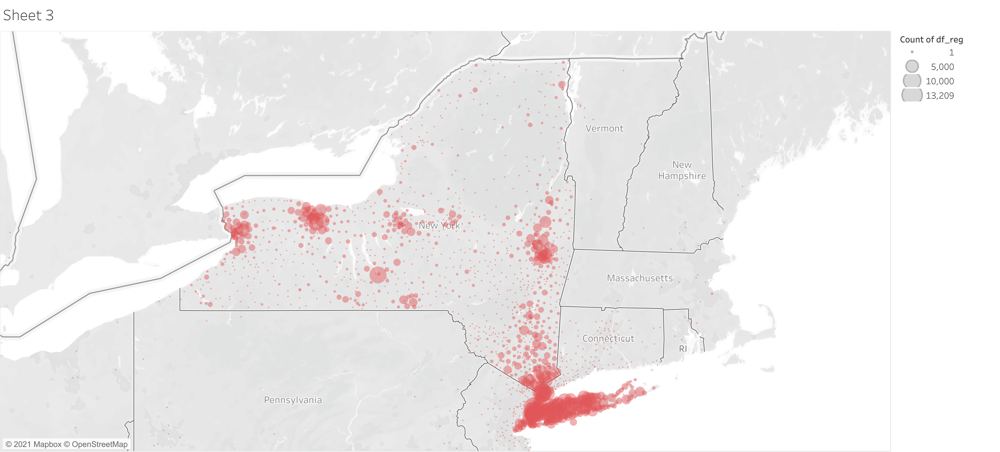

In [8]:
display.Image("registration_count.png")

Size and locations of rebates

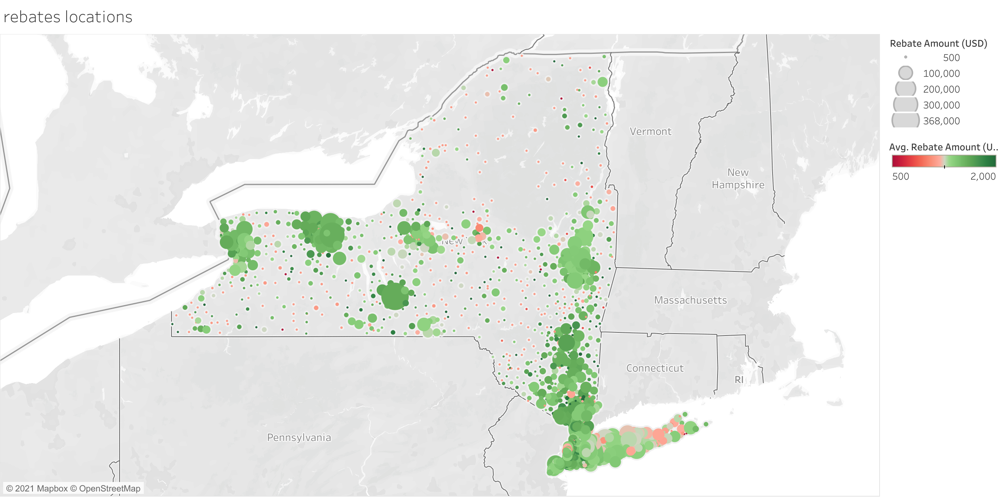

In [9]:
display.Image("rebates locations.png")

Locations of Alternative Fuel Stations with fuel types

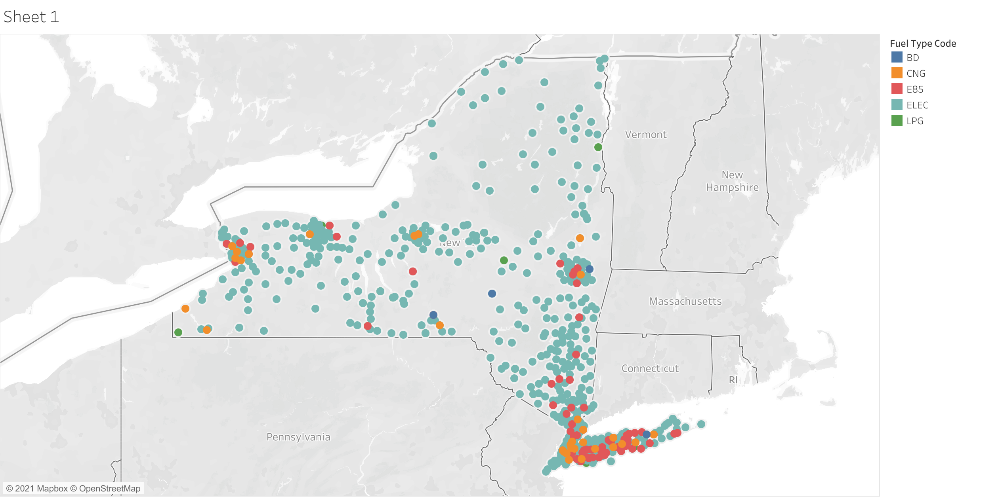

In [10]:
display.Image("stations_map.png")

[Text(0.5, 1.0, 'Count of registrations by year')]

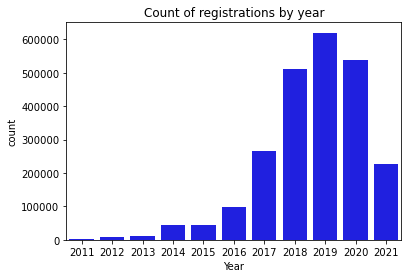

In [11]:
# Use this to decide how to split time series data 
sns.countplot(x='Year', palette=['b'], data=df_reg).set(title='Count of registrations by year')

In [122]:
# df_reg4['Date'] = pd.to_datetime(df_reg4['Registration Valid Date'])
model = LinearRegression()
X = np.asarray(df_reg[['RegistrationYearMonth']])
y = df_reg['ZIP Code']
X_train_true, X_test_true, y_train_true, y_test_true = train_test_split(X, y, test_size = 0.3, random_state=42)
model.fit(X_train_true, y_train_true)
y_test_pred = model.predict(X_test_true)
model.score(X_train_true, y_train_true)

0.0003068408844020265

In [123]:
model.score(X_test_true, y_test_true)

0.00012584738130561046

In [196]:

df_reg['Count'] = 1
df_reg2 = df_reg.groupby(['Registration Valid Date']).sum().reset_index()
df_reg2 = df_reg2.set_index(['Registration Valid Date'])
df_reg2 = df_reg2[['Count']]
df_reg2.head()

,Count
Registration Valid Date,
2011-01-01,2231
2012-01-01,2694
2012-12-31,5283
2013-07-08,6
2013-07-16,1


In [195]:
# df_reg['Count'] = 1
# df_reg2 = df_reg.groupby('Registration Valid Date').size().reset_index()
# df_reg2 = df_reg.set_index('Registration Valid Date')
# df_reg2 = df_reg.set_axis(["Count"], axis=1)
# df_reg2.head()

ValueError: Length mismatch: Expected axis has 12 elements, new values have 1 elements

In [14]:
from chart_studio import plotly as py
import plotly.offline as pyoff
import plotly.graph_objects as go
pyoff.init_notebook_mode()
plot_data = [
    go.Scatter(
        x=df_reg3.index,
        y=df_reg3['Count'],
    )
]
plot_layout = go.Layout(
        title='Daily Registrations'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [15]:
# inspect outlier

In [16]:
print(df_reg3.index[df_reg3['Count'] == df_reg3['Count'].max()])

Index(['2014-12-31'], dtype='object', name='Registration Valid Date')


In [17]:
# Create month and year features and order by date

In [18]:
df_reg4 = df_reg3.reset_index()
df_reg4['Date'] = pd.to_datetime(df_reg4['Registration Valid Date'])
df_reg4.sort_values(by='Date')
df_reg4['Month'] = df_reg4['Date'].dt.month
df_reg4['Year'] = df_reg4['Date'].dt.year
df_reg4 = df_reg4.rename(columns={'Count': 'count_tomorrow'})
df_reg4 = df_reg4[['Date','count_tomorrow','Month','Year']]
df_reg4.head(10)

,Date,count_tomorrow,Month,Year
0,2011-01-01,433,1,2011
1,2012-01-01,563,1,2012
2,2012-12-31,926,12,2012
3,2013-07-08,1,7,2013
4,2013-07-16,1,7,2013
5,2013-07-17,2,7,2013
6,2013-07-18,2,7,2013
7,2013-07-23,3,7,2013
8,2013-07-25,1,7,2013
9,2013-07-31,2,7,2013


In [19]:
# get dummies month feature
df_reg4 = pd.get_dummies(df_reg4, columns=['Month'])
df_reg4.head()

,Date,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
0,2011-01-01,433,2011,1,0,0,0,0,0,0,0,0,0,0,0
1,2012-01-01,563,2012,1,0,0,0,0,0,0,0,0,0,0,0
2,2012-12-31,926,2012,0,0,0,0,0,0,0,0,0,0,0,1
3,2013-07-08,1,2013,0,0,0,0,0,0,1,0,0,0,0,0
4,2013-07-16,1,2013,0,0,0,0,0,0,1,0,0,0,0,0


In [101]:
df_reg4.dtypes

Date              datetime64[ns]
count_tomorrow             int64
Year                       int64
Month_1                    uint8
Month_2                    uint8
Month_3                    uint8
Month_4                    uint8
Month_5                    uint8
Month_6                    uint8
Month_7                    uint8
Month_8                    uint8
Month_9                    uint8
Month_10                   uint8
Month_11                   uint8
Month_12                   uint8
dtype: object

In [20]:
# train test split and train simple model

In [21]:
df_train = df_reg4[df_reg4['Year'] <2021]
df_train.head()

,Date,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
0,2011-01-01,433,2011,1,0,0,0,0,0,0,0,0,0,0,0
1,2012-01-01,563,2012,1,0,0,0,0,0,0,0,0,0,0,0
2,2012-12-31,926,2012,0,0,0,0,0,0,0,0,0,0,0,1
3,2013-07-08,1,2013,0,0,0,0,0,0,1,0,0,0,0,0
4,2013-07-16,1,2013,0,0,0,0,0,0,1,0,0,0,0,0


In [22]:
df_train.info

<bound method DataFrame.info of            Date  count_tomorrow  Year  Month_1  Month_2  Month_3  Month_4  \
0    2011-01-01             433  2011        1        0        0        0   
1    2012-01-01             563  2012        1        0        0        0   
2    2012-12-31             926  2012        0        0        0        0   
3    2013-07-08               1  2013        0        0        0        0   
4    2013-07-16               1  2013        0        0        0        0   
...         ...             ...   ...      ...      ...      ...      ...   
2702 2020-12-27              92  2020        0        0        0        0   
2703 2020-12-28             202  2020        0        0        0        0   
2704 2020-12-29             241  2020        0        0        0        0   
2705 2020-12-30             221  2020        0        0        0        0   
2706 2020-12-31             253  2020        0        0        0        0   

      Month_5  Month_6  Month_7  Month_8  M

In [23]:
df_test= df_reg4[df_reg4['Year']>=2021]
df_test.head()

,Date,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
2707,2021-01-01,59,2021,1,0,0,0,0,0,0,0,0,0,0,0
2708,2021-01-02,78,2021,1,0,0,0,0,0,0,0,0,0,0,0
2709,2021-01-03,53,2021,1,0,0,0,0,0,0,0,0,0,0,0
2710,2021-01-04,175,2021,1,0,0,0,0,0,0,0,0,0,0,0
2711,2021-01-05,141,2021,1,0,0,0,0,0,0,0,0,0,0,0


In [24]:
df_test.info

<bound method DataFrame.info of            Date  count_tomorrow  Year  Month_1  Month_2  Month_3  Month_4  \
2707 2021-01-01              59  2021        1        0        0        0   
2708 2021-01-02              78  2021        1        0        0        0   
2709 2021-01-03              53  2021        1        0        0        0   
2710 2021-01-04             175  2021        1        0        0        0   
2711 2021-01-05             141  2021        1        0        0        0   
...         ...             ...   ...      ...      ...      ...      ...   
2976 2021-09-27             111  2021        0        0        0        0   
2977 2021-09-28             214  2021        0        0        0        0   
2978 2021-09-29             126  2021        0        0        0        0   
2979 2021-09-30             132  2021        0        0        0        0   
2980 2021-10-01               5  2021        0        0        0        0   

      Month_5  Month_6  Month_7  Month_8  M

In [25]:
# check split
print(len(df_test)/len(df_train))

0.10121906169190986


In [26]:
# train simple model using month

In [27]:
model = LinearRegression()
X_train_true =np.asarray(df_train[['Month_1', 'Month_2','Month_3', 'Month_4','Month_5', 'Month_6','Month_7', 'Month_8','Month_9', 'Month_10','Month_11', 'Month_12']])
y_train_true = df_train['count_tomorrow']
X_test_true = np.asarray(df_test[['Month_1', 'Month_2','Month_3', 'Month_4','Month_5', 'Month_6','Month_7', 'Month_8','Month_9', 'Month_10','Month_11', 'Month_12']])
y_test_true = df_test['count_tomorrow']
model.fit(X_train_true, y_train_true)
y_test_pred = model.predict(X_test_true)
model.score(X_train_true, y_train_true)

-0.001601264870275676

In [28]:
model.score(X_test_true, y_test_true)

-3.2126456648725217

In [29]:
rmse = np.sqrt(mean_squared_error(y_test_true, y_test_pred))
rmse

121.08391250952019

In [30]:
# train simple model using year

In [31]:
model = LinearRegression()
X_train_true=df_train['Year']
y_train_true = df_train['count_tomorrow']
X_test_true=df_test['Year']
y_test_true = df_test['count_tomorrow']
X_train_true = X_train_true.values.reshape(-1,1)
y_train_true = y_train_true.values.reshape(-1,1)
X_test_true = X_test_true.values.reshape(-1,1)
y_test_true = y_test_true.values.reshape(-1,1)
model.fit(X_train_true, y_train_true)
y_test_pred = model.predict(X_test_true)
model.score(X_train_true, y_train_true)

0.27038931372177233

In [32]:
model.score(X_test_true, y_test_true)

-0.6012673992288033

In [33]:
rmse = np.sqrt(mean_squared_error(y_test_true, y_test_pred))
rmse

74.6519077821172

In [34]:
# train simple model using month and year

In [35]:
model = LinearRegression()
X_train =np.asarray(df_train[['Month_1', 'Month_2','Month_3', 'Month_4','Month_5', 'Month_6','Month_7', 'Month_8','Month_9', 'Month_10','Month_11', 'Month_12','Year']])
y_train = df_train['count_tomorrow']
X_test = np.asarray(df_test[['Month_1', 'Month_2','Month_3', 'Month_4','Month_5', 'Month_6','Month_7', 'Month_8','Month_9', 'Month_10','Month_11', 'Month_12','Year']])
y_test = df_test['count_tomorrow']
# X_train_true, X_test_true, y_train_true, y_test_true = train_test_split(X, y, test_size = 0.3, random_state=42)
model.fit(X_train, y_train)
y_test_pred = model.predict(X_test)
model.score(X_train, y_train)

0.3079380473264576

In [36]:
model.score(X_test, y_test)

-0.5839448919033001

In [60]:
rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
rmse

74.24701768950045

In [61]:
# Way overfits, very bad model

In [41]:
model_ols = smf.ols(formula='count_tomorrow ~ Month_1 + Month_2 + Month_3 + Month_4 + Month_5 + Month_6 + Month_7 + Month_8 + Month_9 + Month_10 + Month_11 + Month_12 + Year', data=df_train)
model_ols_fit = model_ols.fit()
regression_adj_rsq = model_ols_fit.rsquared_adj
print(regression_adj_rsq)

0.30485536602279084


In [42]:
model_ols_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         count_tomorrow   R-squared:                       0.308
Model:                            OLS   Adj. R-squared:                  0.305
Method:                 Least Squares   F-statistic:                     99.89
Date:                Sat, 04 Dec 2021   Prob (F-statistic):          4.94e-205
Time:                        20:25:06   Log-Likelihood:                -14330.
No. Observations:                2707   AIC:                         2.869e+04
Df Residuals:                    2694   BIC:                         2.876e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -2.672e+04    806.325    -33.133      0.000   -2.83e+04   -2.51e+04
Month_1    -2240.6478     67.335    -33.276      0.000   -2372.682   -2108.614
Month_2    -2240.2984     67.369    -33.254      0.000   -2372.398   -2108.199
Month_3    -2233.4884     67.364    -33.156      0.000   -2365.579   -2101.398
Month_4    -2239.6143     67.360    -33.248      0.000   -2371.697   -2107.532
Month_5    -2231.0641     67.358    -33.123      0.000   -2363.142   -2098.986
Month_6    -2218.9143     67.360    -32.941      0.000   -2350.997   -2086.832
Month_7    -2227.8626     67.302    -33.103      0.000   -2359.830   -2095.895
Month_8    -2223.5332     67.172    -33.102      0.000   -2355.247   -2091.819
Month_9    -2212.9764     67.135    -32.963      0.000   -2344.618   -2081.335
Month_10   -2221.9488     67.133    -33.098      0.000   -2353.586   -2090.312
Month_11   -2223.7726     67.146    -33.118      0.000   -2355.436   -2092.109
Month_12   -2202.0853     67.142    -32.798      0.000   -2333.740   -2070.431
Year          14.3782      0.433     33.196      0.000      13.529      15.227
==============================================================================
Omnibus:                     5137.726   Durbin-Watson:                   1.455
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         11205642.399
Skew:                          14.191   Prob(JB):                         0.00
Kurtosis:                     316.915   Cond. No.                     8.86e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.4e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [43]:
# create count_today and count_tomorrow features

In [132]:
df_reg5 = df_reg4.set_index('Date')
df_reg5['count_today'] = df_reg5['count_tomorrow'].shift(1,freq='D')
df_reg5['count_yesterday'] = df_reg5['count_today'].shift(1,freq='D')
df_reg5['diff'] = (df_reg5['count_today'] - df_reg5['count_yesterday'])
df_reg5.head(10)

,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,count_today,count_yesterday,diff
Date,,,,,,,,,,,,,,,,,
2011-01-01,433,2011,1,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
2012-01-01,563,2012,1,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
2012-12-31,926,2012,0,0,0,0,0,0,0,0,0,0,0,1,NaN,NaN,NaN
2013-07-08,1,2013,0,0,0,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN
2013-07-16,1,2013,0,0,0,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN
2013-07-17,2,2013,0,0,0,0,0,0,1,0,0,0,0,0,1.0,NaN,NaN
2013-07-18,2,2013,0,0,0,0,0,0,1,0,0,0,0,0,2.0,1.0,1.0
2013-07-23,3,2013,0,0,0,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN
2013-07-25,1,2013,0,0,0,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN


In [133]:
# replace NaNs with 0

In [134]:
df_reg5 = df_reg5.fillna(0)
df_reg5.head(10)

,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,count_today,count_yesterday,diff
Date,,,,,,,,,,,,,,,,,
2011-01-01,433,2011,1,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0
2012-01-01,563,2012,1,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0
2012-12-31,926,2012,0,0,0,0,0,0,0,0,0,0,0,1,0.0,0.0,0.0
2013-07-08,1,2013,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0
2013-07-16,1,2013,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0
2013-07-17,2,2013,0,0,0,0,0,0,1,0,0,0,0,0,1.0,0.0,0.0
2013-07-18,2,2013,0,0,0,0,0,0,1,0,0,0,0,0,2.0,1.0,1.0
2013-07-23,3,2013,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0
2013-07-25,1,2013,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0


In [135]:
pyoff.init_notebook_mode()
plot_data = [
    go.Scatter(
        x=df_reg5.index,
        y=df_reg5['diff'],
    )
]
plot_layout = go.Layout(
        title='Daily Registrations'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [136]:
# Train test split new df

In [137]:
df_train = df_reg5[df_reg5['Year'] <2021]
df_train.head()

,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,count_today,count_yesterday,diff
Date,,,,,,,,,,,,,,,,,
2011-01-01,433,2011,1,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0
2012-01-01,563,2012,1,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0
2012-12-31,926,2012,0,0,0,0,0,0,0,0,0,0,0,1,0.0,0.0,0.0
2013-07-08,1,2013,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0
2013-07-16,1,2013,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0


In [138]:
df_test= df_reg5[df_reg5['Year']>=2021]
df_test.head()

,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,count_today,count_yesterday,diff
Date,,,,,,,,,,,,,,,,,
2021-01-01,59,2021,1,0,0,0,0,0,0,0,0,0,0,0,253.0,221.0,32.0
2021-01-02,78,2021,1,0,0,0,0,0,0,0,0,0,0,0,59.0,253.0,-194.0
2021-01-03,53,2021,1,0,0,0,0,0,0,0,0,0,0,0,78.0,59.0,19.0
2021-01-04,175,2021,1,0,0,0,0,0,0,0,0,0,0,0,53.0,78.0,-25.0
2021-01-05,141,2021,1,0,0,0,0,0,0,0,0,0,0,0,175.0,53.0,122.0


In [139]:
# train simple model using prev_day

In [140]:
model = LinearRegression()
X_train_true=df_train['count_today']
y_train_true = df_train['count_tomorrow']
X_test_true=df_test['count_today']
y_test_true = df_test['count_tomorrow']
X_train_true = X_train_true.values.reshape(-1,1)
y_train_true = y_train_true.values.reshape(-1,1)
X_test_true = X_test_true.values.reshape(-1,1)
y_test_true = y_test_true.values.reshape(-1,1)
model.fit(X_train_true, y_train_true)
y_test_pred = model.predict(X_test_true)
model.score(X_train_true, y_train_true)

0.18620567245569042

In [141]:
model.score(X_test_true, y_test_true)

-0.7403303860159636

In [142]:
rmse = np.sqrt(mean_squared_error(y_test_true, y_test_pred))
rmse

77.82602182568048

In [143]:
model = LinearRegression()
X_train_true=df_train['diff']
y_train_true = df_train['count_tomorrow']
X_test_true=df_test['diff']
y_test_true = df_test['count_tomorrow']
X_train_true = X_train_true.values.reshape(-1,1)
y_train_true = y_train_true.values.reshape(-1,1)
X_test_true = X_test_true.values.reshape(-1,1)
y_test_true = y_test_true.values.reshape(-1,1)
model.fit(X_train_true, y_train_true)
y_test_pred = model.predict(X_test_true)
model.score(X_train_true, y_train_true)

0.005511545696264553

In [144]:
model.score(X_test_true, y_test_true)

-3.1035034234624357

In [145]:
rmse = np.sqrt(mean_squared_error(y_test_true, y_test_pred))
rmse

119.50508360569405

In [146]:
#much more accurate than year and month

In [147]:
# train using diff and prev_day

In [148]:
model = LinearRegression()
X_train =np.asarray(df_train[['diff', 'count_today']])
y_train = df_train['count_tomorrow']
X_test = np.asarray(df_test[['diff', 'count_today']])
y_test = df_test['count_tomorrow']
# X_train_true, X_test_true, y_train_true, y_test_true = train_test_split(X, y, test_size = 0.3, random_state=42)
model.fit(X_train, y_train)
y_test_pred = model.predict(X_test)
model.score(X_train, y_train)

0.21582297922982063

In [149]:
model.score(X_test, y_test)

-0.5013830031213757

In [150]:
rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
rmse

72.28608889931525

In [151]:
# Diff and count today are good predictors for count tomorrow 

In [152]:
# time series forecasting using lags

In [153]:
df_supervised = df_reg5.reset_index()
for inc in range(1,13):
    field_name = 'lag_' + str(inc)
    # decreasing so it moves backwards
    df_supervised[field_name] = df_supervised['diff'].shift(-inc)
#drop null values
df_supervised = df_supervised.dropna().reset_index(drop=True)
df_supervised.head(10)

,Date,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,...,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12
0,2011-01-01,433,2011,1,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2012-01-01,563,2012,1,0,0,0,0,0,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2012-12-31,926,2012,0,0,0,0,0,0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
3,2013-07-08,1,2013,0,0,0,0,0,0,1,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,-3.0
4,2013-07-16,1,2013,0,0,0,0,0,0,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,-3.0,0.0
5,2013-07-17,2,2013,0,0,0,0,0,0,1,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,-3.0,0.0,0.0
6,2013-07-18,2,2013,0,0,0,0,0,0,1,...,0.0,0.0,0.0,0.0,0.0,3.0,-3.0,0.0,0.0,1.0
7,2013-07-23,3,2013,0,0,0,0,0,0,1,...,0.0,0.0,0.0,0.0,3.0,-3.0,0.0,0.0,1.0,2.0
8,2013-07-25,1,2013,0,0,0,0,0,0,1,...,0.0,0.0,0.0,3.0,-3.0,0.0,0.0,1.0,2.0,2.0
9,2013-07-31,2,2013,0,0,0,0,0,0,1,...,0.0,0.0,3.0,-3.0,0.0,0.0,1.0,2.0,2.0,-3.0


In [ ]:
# merge df_supervised with df_reg by date 
df_merged = df

In [155]:
#train model using lags

In [156]:
df_train = df_supervised[df_supervised['Year'] <2021]
df_train.head()

,Date,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,...,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12
0,2011-01-01,433,2011,1,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2012-01-01,563,2012,1,0,0,0,0,0,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2012-12-31,926,2012,0,0,0,0,0,0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
3,2013-07-08,1,2013,0,0,0,0,0,0,1,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,-3.0
4,2013-07-16,1,2013,0,0,0,0,0,0,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,-3.0,0.0


In [157]:
df_train.info

<bound method DataFrame.info of            Date  count_tomorrow  Year  Month_1  Month_2  Month_3  Month_4  \
0    2011-01-01             433  2011        1        0        0        0   
1    2012-01-01             563  2012        1        0        0        0   
2    2012-12-31             926  2012        0        0        0        0   
3    2013-07-08               1  2013        0        0        0        0   
4    2013-07-16               1  2013        0        0        0        0   
...         ...             ...   ...      ...      ...      ...      ...   
2702 2020-12-27              92  2020        0        0        0        0   
2703 2020-12-28             202  2020        0        0        0        0   
2704 2020-12-29             241  2020        0        0        0        0   
2705 2020-12-30             221  2020        0        0        0        0   
2706 2020-12-31             253  2020        0        0        0        0   

      Month_5  Month_6  Month_7  ...  lag_3

In [158]:
df_test= df_supervised[df_supervised['Year']>=2021]
df_test.head()

,Date,count_tomorrow,Year,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,...,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12
2707,2021-01-01,59,2021,1,0,0,0,0,0,0,...,-25.0,122.0,-34.0,-35.0,33.0,-18.0,-42.0,-14.0,99.0,-53.0
2708,2021-01-02,78,2021,1,0,0,0,0,0,0,...,122.0,-34.0,-35.0,33.0,-18.0,-42.0,-14.0,99.0,-53.0,12.0
2709,2021-01-03,53,2021,1,0,0,0,0,0,0,...,-34.0,-35.0,33.0,-18.0,-42.0,-14.0,99.0,-53.0,12.0,-20.0
2710,2021-01-04,175,2021,1,0,0,0,0,0,0,...,-35.0,33.0,-18.0,-42.0,-14.0,99.0,-53.0,12.0,-20.0,16.0
2711,2021-01-05,141,2021,1,0,0,0,0,0,0,...,33.0,-18.0,-42.0,-14.0,99.0,-53.0,12.0,-20.0,16.0,-45.0


In [159]:
df_test.info

<bound method DataFrame.info of            Date  count_tomorrow  Year  Month_1  Month_2  Month_3  Month_4  \
2707 2021-01-01              59  2021        1        0        0        0   
2708 2021-01-02              78  2021        1        0        0        0   
2709 2021-01-03              53  2021        1        0        0        0   
2710 2021-01-04             175  2021        1        0        0        0   
2711 2021-01-05             141  2021        1        0        0        0   
...         ...             ...   ...      ...      ...      ...      ...   
2964 2021-09-15             147  2021        0        0        0        0   
2965 2021-09-16             156  2021        0        0        0        0   
2966 2021-09-17             181  2021        0        0        0        0   
2967 2021-09-18             122  2021        0        0        0        0   
2968 2021-09-19              65  2021        0        0        0        0   

      Month_5  Month_6  Month_7  ...  lag_3

In [160]:
# Import statsmodels.formula.api
import statsmodels.formula.api as smf
# Define the regression formula
model = smf.ols(formula='diff ~ lag_1', data=df_train)
# Fit the regression
model_fit = model.fit()
# Extract the adjusted r-squared
regression_adj_rsq = model_fit.rsquared_adj
print(regression_adj_rsq)

0.17949766321856897


In [161]:
model_fit.predict()

array([  0.09286171,   0.09286171,   0.09286171, ..., -16.44326625,
         8.57292733, -13.47524328])

In [162]:
print(model_fit.t_test([1, 0]))

                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.0929      0.964      0.096      0.923      -1.797       1.983


In [163]:
# Define the regression formula
model = smf.ols(formula='diff ~ lag_1 + lag_2 + lag_3 + lag_4 + lag_5 + lag_6 + lag_7 + lag_8 + lag_9 + lag_10 + lag_11 + lag_12', data=df_train)
# Fit the regression
model_fit = model.fit()
# Extract the adjusted r-squared
regression_adj_rsq = model_fit.rsquared_adj
print(regression_adj_rsq)

0.43969171421237707


In [164]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   diff   R-squared:                       0.442
Model:                            OLS   Adj. R-squared:                  0.440
Method:                 Least Squares   F-statistic:                     178.0
Date:                Sat, 04 Dec 2021   Prob (F-statistic):               0.00
Time:                        23:26:02   Log-Likelihood:                -13916.
No. Observations:                2707   AIC:                         2.786e+04
Df Residuals:                    2694   BIC:                         2.794e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1958      0.797      0.246      0.806      -1.366       1.758
lag_1         -0.8263      0.019    -43.174      0.000      -0.864      -0.789
lag_2         -0.7738      0.025    -31.280      0.000      -0.822      -0.725
lag_3         -0.7029      0.029    -24.469      0.000      -0.759      -0.647
lag_4         -0.6486      0.032    -20.556      0.000      -0.710      -0.587
lag_5         -0.6339      0.034    -18.771      0.000      -0.700      -0.568
lag_6         -0.5288      0.036    -14.869      0.000      -0.599      -0.459
lag_7         -0.2556      0.036     -7.188      0.000      -0.325      -0.186
lag_8         -0.1758      0.034     -5.208      0.000      -0.242      -0.110
lag_9         -0.1811      0.032     -5.742      0.000      -0.243      -0.119
lag_10        -0.1416      0.029     -4.937      0.000      -0.198      -0.085
lag_11        -0.1038      0.025     -4.202      0.000      -0.152      -0.055
lag_12        -0.1066      0.019     -5.593      0.000      -0.144      -0.069
==============================================================================
Omnibus:                     5635.563   Durbin-Watson:                   2.042
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         29624361.439
Skew:                         -17.161   Prob(JB):                         0.00
Kurtosis:                     514.340   Cond. No.                         73.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [165]:
# Define the regression formula
model = smf.ols(formula='count_tomorrow ~ lag_1 + lag_2 + lag_3 + lag_4 + lag_5 + lag_6 + lag_7 + lag_8 + lag_9 + lag_10 + lag_11 + lag_12', data=df_train)
# Fit the regression
model_fit = model.fit()
# Extract the adjusted r-squared
regression_adj_rsq = model_fit.rsquared_adj
print(regression_adj_rsq)

0.4625849259876512


In [166]:
# linear regression with lags

In [167]:
model = LinearRegression()
X_train_true = df_train[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', 'lag_11', 'lag_12']].values
# X_train_true = np.asarray(df_train[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', 'lag_11', 'lag_12']])
y_train_true = df_train['count_tomorrow']
X_test_true = np.asarray(df_test[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', 'lag_11', 'lag_12']])
y_test_true = df_test['count_tomorrow']
model.fit(X_train_true, y_train_true)
y_test_pred = model.predict(X_test_true)
model.score(X_train_true, y_train_true)

0.46496814139347087

In [168]:
model.score(X_test_true, y_test_true)

-2.5890052557432703

In [169]:
rmse = np.sqrt(mean_squared_error(y_test_true, y_test_pred))
rmse

111.04347926969233

In [170]:
model = LinearRegression()
X_train_true = np.asarray(df_train[['count_today', 'diff','lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', 'lag_11', 'lag_12']])
y_train_true = df_train['count_tomorrow']
X_test_true = np.asarray(df_test[['count_today','diff','lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', 'lag_11', 'lag_12']])
y_test_true = df_test['count_tomorrow']
model.fit(X_train_true, y_train_true)
y_test_pred = model.predict(X_test_true)
model.score(X_train_true, y_train_true)

0.8495290604490103

In [171]:
model.score(X_test_true, y_test_true)

0.99781361532081

In [172]:
rmse = np.sqrt(mean_squared_error(y_test_true, y_test_pred))
rmse

2.740749234078831

In [173]:
#split data to data before/during rebate and data after 

In [174]:
print(df_rebate[df_rebate['Submitted Date'] == df_rebate['Submitted Date'].min()])

      Data through Date Submitted Date    Make        Model   County    ZIP  \
15319        02/29/2020     01/01/2018  Toyota  Prius Prime   Queens  11415   
22138        02/29/2020     01/01/2018     BMW         330e  Suffolk  11795   

      EV Type  Annual GHG Emissions Reductions (MT CO2e)  \
15319    PHEV                                       3.03   
22138    PHEV                                       1.13   

       Annual Petroleum Reductions (gallons)  Rebate Amount (USD)  \
15319                                 440.11                 1100   
22138                                 239.66                  500   

       Transaction Type_Lease  Transaction Type_Purchase  rebate_count  
15319                       1                          0             1  
22138                       1                          0             1  


In [175]:
print(df_rebate[df_rebate['Submitted Date'] == df_rebate['Submitted Date'].max()])

      Data through Date Submitted Date        Make                 Model  \
1306         02/29/2020     12/31/2019   Chevrolet                  Bolt   
1313         02/29/2020     12/31/2019   Chevrolet                  Bolt   
1383         02/29/2020     12/31/2019   Chevrolet                  Bolt   
1501         02/29/2020     12/31/2019   Chevrolet                  Bolt   
1522         02/29/2020     12/31/2019   Chevrolet                  Bolt   
2104         02/29/2020     12/31/2019   Chevrolet                  Volt   
3453         02/29/2020     12/31/2019      Nissan                  LEAF   
3857         02/29/2020     12/31/2019      Nissan                  LEAF   
4065         02/29/2020     12/31/2019      Nissan                  LEAF   
11587        02/29/2020     12/31/2019  Mitsubishi             Outlander   
12070        02/29/2020     12/31/2019       Honda               Clarity   
15574        02/29/2020     12/31/2019      Toyota           Prius Prime   
15645       

In [176]:
df_rebate['rebate_count'] = 1
df_reb = df_rebate.groupby(['Submitted Date']).sum().reset_index()
# df_reb = df_reb.set_index(['Submitted Date'])
df_reb = df_reb[['Submitted Date','rebate_count', 'Rebate Amount (USD)']]
df_reb.head()

,Submitted Date,rebate_count,Rebate Amount (USD)
0,01/01/2018,2,1600
1,01/01/2019,10,14000
2,01/01/2020,2,2500
3,01/02/2018,18,21000
4,01/02/2019,52,76100


In [177]:
# df_reb2 = df_reb.set_index(['Submitted Date'])
# df_reb2 = df_reb.reset_index()
df_reb2 = df_reb.copy()
df_reb2['Date'] = pd.to_datetime(df_reb2['Submitted Date'],format='%m/%d/%Y', errors='coerce')
# df_reb2['Date'] = pd.to_datetime(df_reb['Submitted Date'],infer_datetime_format=True, errors='coerce')
df_reb2.sort_values(by='Date')
df_reb2 = df_reb2[['Date','rebate_count', 'Rebate Amount (USD)']]
df_reb2.head(10)

,Date,rebate_count,Rebate Amount (USD)
0,2018-01-01,2,1600
1,2019-01-01,10,14000
2,2020-01-01,2,2500
3,2018-01-02,18,21000
4,2019-01-02,52,76100
5,2020-01-02,28,34400
6,2018-01-03,22,22400
7,2019-01-03,37,48200
8,2020-01-03,28,31700
9,2018-01-04,7,9800


In [178]:
# merge with dataframes

In [179]:
df_reb3 = df_reb2.merge(df_supervised[['Date', 'Year','count_yesterday', 'count_today', 'count_tomorrow', 'diff']])
df_reb3.head()

,Date,rebate_count,Rebate Amount (USD),Year,count_yesterday,count_today,count_tomorrow,diff
0,2018-01-01,2,1600,2018,96.0,37.0,24,-59.0
1,2019-01-01,10,14000,2019,52.0,194.0,28,142.0
2,2020-01-01,2,2500,2020,143.0,153.0,35,10.0
3,2018-01-02,18,21000,2018,37.0,24.0,72,-13.0
4,2019-01-02,52,76100,2019,194.0,28.0,105,-166.0


In [180]:
df_reb3 = df_reb3.rename(columns={'Rebate Amount (USD)': 'rebate_amount'})

[Text(0.5, 1.0, 'Count of registrations by year')]

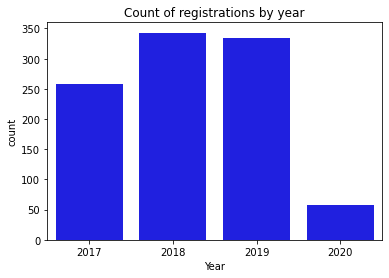

In [181]:
# Use this to decide how to split time series data 
sns.countplot(x='Year', palette=['b'], data=df_reb3).set(title='Count of registrations by year')

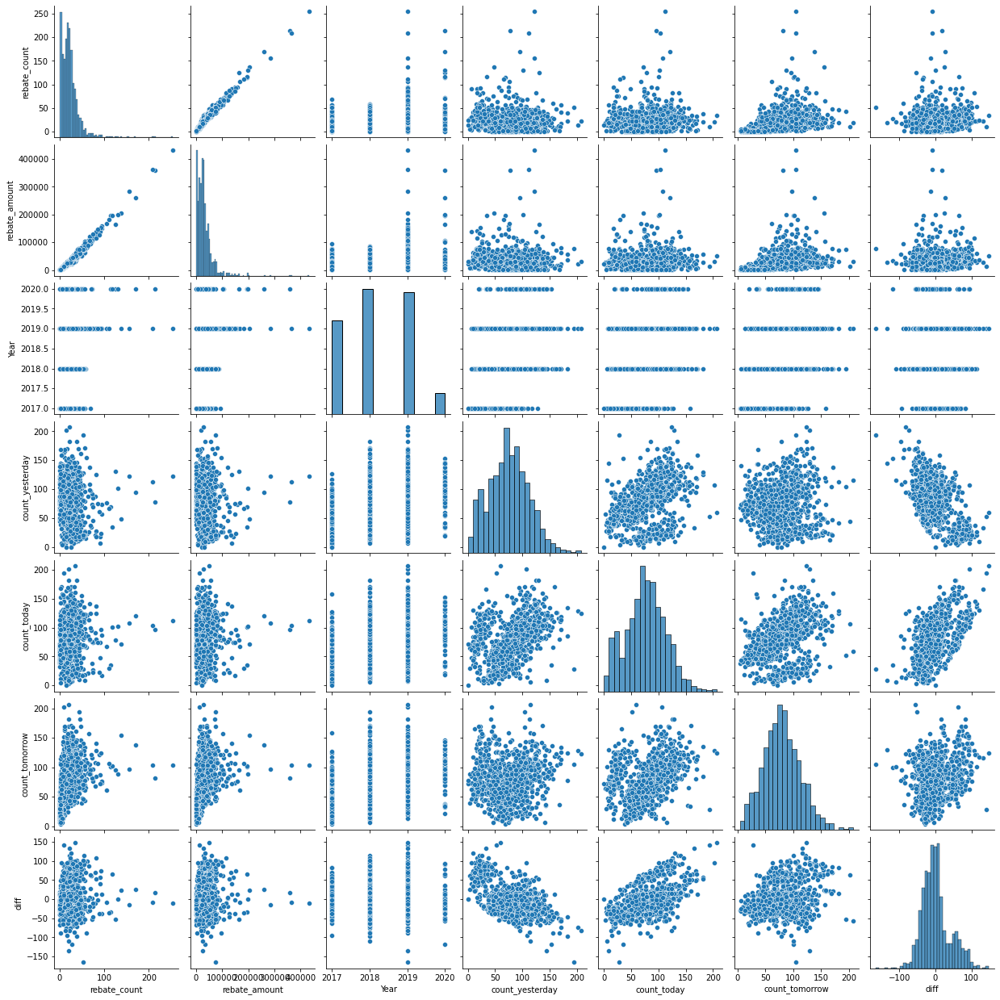

In [182]:
sns.pairplot(df_reb3)

In [183]:
# create final train & test datasets

In [184]:
df_train_final = df_reb3[df_reb3['Date'] <'2019-07-01']
df_train_final.head()

,Date,rebate_count,rebate_amount,Year,count_yesterday,count_today,count_tomorrow,diff
0,2018-01-01,2,1600,2018,96.0,37.0,24,-59.0
1,2019-01-01,10,14000,2019,52.0,194.0,28,142.0
3,2018-01-02,18,21000,2018,37.0,24.0,72,-13.0
4,2019-01-02,52,76100,2019,194.0,28.0,105,-166.0
6,2018-01-03,22,22400,2018,24.0,72.0,53,48.0


In [185]:
df_test_final = df_reb3[df_reb3['Date']>='2019-07-01']
df_test_final.head()

,Date,rebate_count,rebate_amount,Year,count_yesterday,count_today,count_tomorrow,diff
2,2020-01-01,2,2500,2020,143.0,153.0,35,10.0
5,2020-01-02,28,34400,2020,153.0,35.0,100,-118.0
8,2020-01-03,28,31700,2020,35.0,100.0,82,65.0
11,2020-01-04,2,2200,2020,100.0,82.0,54,-18.0
14,2020-01-05,3,3300,2020,82.0,54.0,33,-28.0


In [186]:
# check split
print(len(df_test_final)/len(df_train_final))

0.2980392156862745


In [187]:
# save train and test dataframes with the features
df_train_final.to_csv('train.csv', index=False)
df_test_final.to_csv('test.csv', index=False)